Exploration 1 - 거울아 거울아, 나는 멍멍이 상이니, 아니면 냥이 상이니?
---

# Project 'Flower classifier'

- `거울아 거울아, 나는 멍멍이 상이니, 아니면 냥이 상이니?` 노드에서 진행한 내용을 바탕으로 새로운 데이터 셋으로 classifier를 만든다


In [1]:
# 관련 패키지 버전 등의 경고 메시지 출력제어
import warnings
warnings.filterwarnings("ignore")

print('Done!')

Done!


## Load dataset
- `tensorflow_datasets`에 포함된 `tf_flowers`데이터 사용
    - https://www.tensorflow.org/datasets/catalog/tf_flowers
    - [tutorials](https://arc.net/l/quote/lkezvlqr)
    - [blog](https://rfriend.tistory.com/527)
    
**데이터 기본 정보**
- train 데이터 3,670개
- 클래스 5개

In [2]:
import tensorflow_datasets as tfds

In [3]:
import os
import tensorflow as tf

# 현재 주피터 노트북이 실행 중인 디렉토리를 가져옴
current_directory = os.getcwd()

# 데이터셋을 저장할 경로 설정 (현재 디렉토리 기준으로 상대 경로로 설정)
data_path = os.path.join(current_directory, 'flowers')

# 경로가 존재하지 않는 경우, 해당 경로를 생성
if not os.path.exists(data_path):
    os.makedirs(data_path)

# TensorFlow와 TensorFlow Datasets 버전 확인
print(f"TensorFlow version: {tf.__version__}")
print(f"TensorFlow Datasets version: {tfds.__version__}")


TensorFlow version: 2.6.0
TensorFlow Datasets version: 4.4.0


---

`tfds.load`
- `split=` : Which split to read (e.g. 'train', ['train', 'test'], 'train[80%:]',...)
- `shuffle_files=` : Control whether to shuffle the files between each epoch.
- `data_dir=` : Location where the dataset is saved ( defaults to ~/tensorflow_datasets/)
- `with_info=True` : Returns the tfds.core.DatasetInfo containing dataset metadata
- `download=False` : Disable download
- `as_supervised=True` : you can get a tuple (features, label) instead for supervised datasets.

[ref]
[tf doc](https://www.tensorflow.org/datasets/api_docs/python/tfds/load), 
[blog](https://kvirajdatt.medium.com/starting-with-tensorflow-datasets-part-2-intro-to-tfds-and-its-methods-32d3ac36420f)

In [4]:
# load data in directory
(raw_train, raw_validation, raw_test), metadata = tfds.load(
    name='tf_flowers',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    shuffle_files=True,
    data_dir=data_path,
    with_info=True,
    download=True,  # 다운받은 파일이 없기때문에 True로 변경
    as_supervised=True,
)

- `download=False` 때문에 계속 데이터셋이 없다고 에러가 났는데, 데이터를 어디에서 다운받을지 몰라서 헤맸지만 강훈님 도움으로 해결
    - 위에서 이 변수 내용 확인해놓고도 생각을 못했다:)

- **Split data**
    - train : 80% - 2936개
    - validation : 10% - 367개
    - test : 10% - 367개

In [5]:
# 데이터 확인
print(raw_train, len(raw_train))
print(raw_validation, len(raw_validation))
print(raw_test, len(raw_test))

<_OptionsDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)> 2936
<_OptionsDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)> 367
<_OptionsDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)> 367


- 모든 데이터셋은 `(image, label)` 형태를 가짐

`(None, None, 3)` :  이미지 shape (height, width, channel)
- `(None, None)` 은 이미지크기가 다 다르기때문에 이렇게 출력됨
- 3차원 이미지 : 컬러
    
뒷부분의 `()`는 정답 카테고리인 label shape
- 꽃의 클래스를 나타냄
- 1차원의 숫자 5개로 표현가능하기때문에 차원이 없음

**데이터수가 너무 적기때문에 Data augmentation을 진행한 뒤에 훈련을 진행한다**

In [6]:
metadata

tfds.core.DatasetInfo(
    name='tf_flowers',
    full_name='tf_flowers/3.0.1',
    description="""
    A large set of images of flowers
    """,
    homepage='https://www.tensorflow.org/tutorials/load_data/images',
    data_path='/aiffel/aiffel/workplace/EXPLORATION/flowers/tf_flowers/3.0.1',
    download_size=218.21 MiB,
    dataset_size=221.83 MiB,
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=tf.uint8),
        'label': ClassLabel(shape=(), dtype=tf.int64, num_classes=5),
    }),
    supervised_keys=('image', 'label'),
    disable_shuffling=False,
    splits={
        'train': <SplitInfo num_examples=3670, num_shards=2>,
    },
    citation="""@ONLINE {tfflowers,
    author = "The TensorFlow Team",
    title = "Flowers",
    month = "jan",
    year = "2019",
    url = "http://download.tensorflow.org/example_images/flower_photos.tgz" }""",
)

- 위에서 받은 `metadata`는 뭔지 궁금해서 봤더니 이런 정보를 갖고 있다

In [7]:
# label 이름 확인
metadata.features['label'].names

['dandelion', 'daisy', 'tulips', 'sunflowers', 'roses']

- 총 5개 클래스로 구분되어있다 

## Data pre-processing

In [8]:
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

print('*')

*


### Visualize data
- `raw_train` 안에 있는 데이터를 확인
- `tf.data.Dataset`의 `take` 함수 사용
    - 인수로 받은 만큼의 개수만큼 데이터를 추출해서 새로운 데이터셋인스턴스를 생성하고 리턴

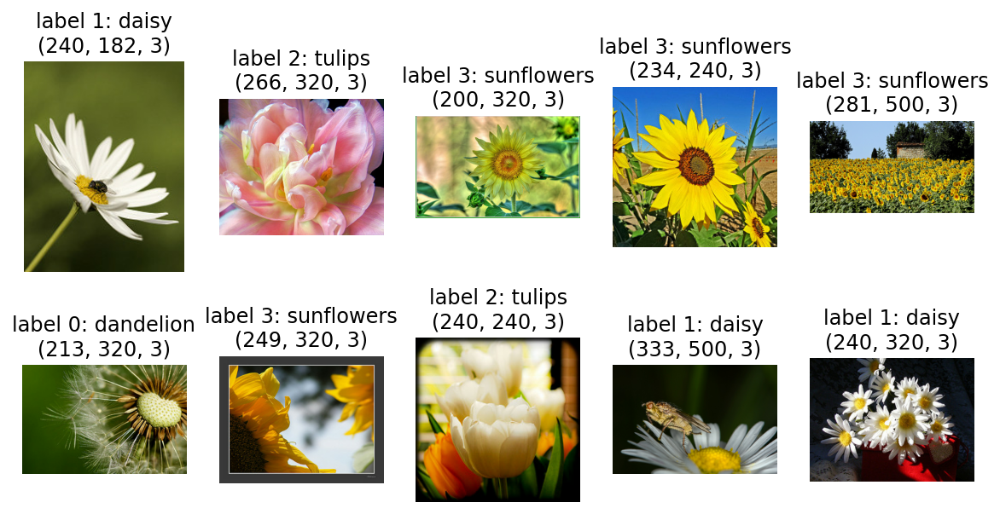

In [9]:
plt.figure(figsize=(10,5))

get_label_name=metadata.features['label'].int2str

for idx, (img, label) in enumerate(raw_train.take(10)): #10 dataset instance
    plt.subplot(2, 5, idx+1)
    plt.imshow(img)
    plt.title(f'label {label}: {get_label_name(label)}\n{img.shape}')
    plt.axis('off')

**정보 1**

- label 인덱스는 위에서 확인한 리스트 index로 보인다.
>`dandelion` : 0<br>
`daisy` : 1<br>
`tulips` : 2<br>
`sunflowers` : 3<br>
`roses` : 4<br>

**정보 2**
- 이미지 사이즈가 제각각 
👉 이미지 리사이징 필요 : `format_example()`
> ‍🌈 간단 상식 - 타입캐스팅(Type Casting)<br>
형변환이라고도 불리는 타입개스팅은 다른 데이터 타입으로 형(타입)을 바꿔주는 것을 의미합니다. 정수형을 실수형으로 바꾸기 위해 float()를 사용하는 것이 타입캐스팅의 한 예입니다.

### Preprocessing 1 - Data resize
- format_example()

In [10]:
# 이미지 리사이징 함수
def format_example(image, label):
    image = tf.cast(image, tf.float32)  # image=float(image)같은 타입캐스팅의 텐서플로우 버전
    image = (image/127.5) - 1 # 픽셀값 scale 수정 : -1~1 사이의 값
    image = tf.image.resize(image, IMG_SIZE)
    return image, label

In [11]:
# 리사이징할 이미지의 크기
IMG_SIZE = [160, 160] 

In [12]:
# resize dataset
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

print(train)
print(validation)
print(test)

<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>
<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>
<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>


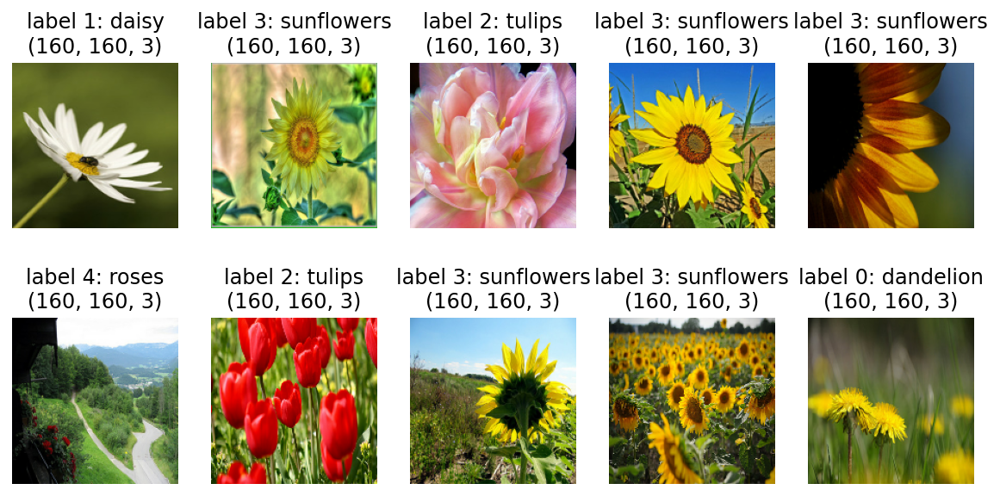

In [13]:
# 이미지 리사이징한후 시각화
plt.figure(figsize=(10,5))

get_label_name=metadata.features['label'].int2str

for idx, (img, label) in enumerate(train.take(10)): #10 dataset instance
    plt.subplot(2, 5, idx+1)
    img = (img + 1) / 2 # 원래 픽셀값으로 돌려줌
    plt.imshow(img)
    plt.title(f'label {label}: {get_label_name(label)}\n{img.shape}')
    plt.axis('off')

## Data batches
- `BATCH_SIZE`에 따라 32개의 데이터를 랜덤으로 뿌려줄 `train_batches`, `validation_batches`, `test_batches` 생성
    - `train_batches`는 모델이 끊임없이 학습될 수 있도록 전체 데이터에서 32개를 랜덤으로 뽑아 계속 제공

In [14]:
# 배치사이즈, 학습데이터 적절히 섞을 shuffle_buffer_size
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000

In [15]:
train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)

In [16]:
# train batch 중 하나 확인
for image_batch, label_batch in train_batches.take(1):
    break

image_batch.shape, label_batch.shape

(TensorShape([32, 160, 160, 3]), TensorShape([32]))

- 한 개의 배치에는 32개의 이미지가 존재!

## Preprocessing 2 - Data augmentation

**tensorflow keras `ImageDataGenerator`**
- 작동 컨셉
    1. ImageDataGenerator 객체에 옵션 정의
    2. 내장된 flow() 함수에 데이터셋을 넣음
    3. 이 객체를 keras.Model.fit() 함수에 흘려주면 데이터가 Augmentation되며 모델에 사용된다
   
- [참고 텐서플로우 공식 문서페이지](https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image/ImageDataGenerator#used-in-the-notebooks)
- [참고 블로그](https://blog.naver.com/PostView.naver?blogId=siniphia&logNo=222118275636&parentCategoryNo=&categoryNo=&viewDate=&isShowPopularPosts=false&from=postView)

In [17]:
from keras.preprocessing.image import ImageDataGenerator

aug = ImageDataGenerator(rotation_range=20, 
                             width_shift_range=0.2, 
                             height_shift_range=0.2, 
                             horizontal_flip=True)  # 20도 회전 및 좌우반전

# generator - 모델학습때 이 generator로 train data를 흘려보낸다
gen = aug.flow(train_batches)

TypeError: float() argument must be a string or a number, not 'BatchDataset'

- batch dataset 형태의 데이터는 generator에 사용할수 없나보다.
- `augment` 함수를 사용해서 진행하는것으로 수정한다.

In [18]:
# augmentation function
def augment(img, label):
    # Randomly flip left or right
    img = tf.image.random_flip_left_right(img)
    
    # add 3 pixels of padding
    img = tf.image.resize_with_crop_or_pad(img, IMG_SIZE[0]+3, IMG_SIZE[1]+3)
    # random crop back to the original size
    img = tf.image.random_crop(img, size=[IMG_SIZE[0],IMG_SIZE[1],3])
    
    return img,label

In [19]:
# 데이터 로드할 때 빠르게 로드할 수 있도록하는 설정 변수
AUTOTUNE = tf.data.experimental.AUTOTUNE

In [20]:
# augmentation + making batcheset
def prepare_for_training(ds):
    # data augmentation including normalization
    ds = ds.map(augment, num_parallel_calls=AUTOTUNE)
    
    # make batchset
    ds = ds.shuffle(SHUFFLE_BUFFER_SIZE)
    ds = ds.batch(BATCH_SIZE)
    ds = ds.prefetch(buffer_size=AUTOTUNE)
    
    return ds

In [21]:
# make train, validation batches with augmentation
train_batches = prepare_for_training(train)
validation_batches = validation.batch(BATCH_SIZE)

# make test batches without augmentation
test_batches = test.batch(BATCH_SIZE)

In [22]:
# train batch 중 하나 확인
for image_batch, label_batch in train_batches.take(1):
    break

image_batch.shape, label_batch.shape

(TensorShape([32, 160, 160, 3]), TensorShape([32]))

In [23]:
# 데이터 개수 확인
len(train_batches)*32 # 총 32개 배치

2944

- 2936이었던 데이터가 2944로 아주 조금 늘었다. 
- 데이터 증강을 하면 기본적으로 몇개의 데이터가 늘어나는건지 찾아보자
 > **There are no added images via augmentation.** Augmentations are stacked on the image when drawn from a batch. Batch to batch these augmented images will be slightly different as randomness is involved in how they’re applied when pulling the batch. If you started with a dataset of 100 images, 100 images will be fed per epoch. [src](https://forums.fast.ai/t/how-to-check-there-are-how-many-images-after-augmentation-in-the-dataset-in-fast-ai-what-is-the-function-to-know/88763/8)
 
    - 데이터증강에 대한 구체적인 과정을 제대로 이해하지 못한것 같다.
- 증강이 잘 되었는지만 확인후 일단 모델 부분으로 넘어가자
 

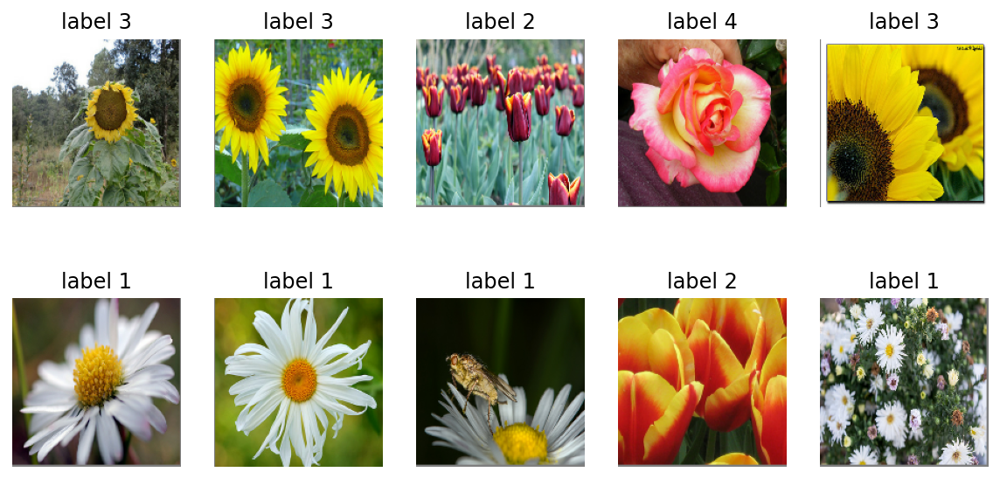

In [24]:
# 증강된 데이터 확인
plt.figure(figsize=(10,5))

for idx, (image_batch, label_batch) in enumerate(train_batches.take(10)):
    plt.subplot(2, 5, idx+1)
    img = (image_batch[0] + 1) / 2 # 원래 픽셀값으로 돌려줌
    plt.imshow(img)
    plt.title(f'label {label_batch[0]}')
    plt.axis('off')

- 여러번 출력해보다가, `고양이, 자동차, 사람, 나비` 등 꽃이 아닌 이미지가 섞인 데이터들을 확인했다.
    - 모델 훈련 후에 결과값에서 이상치를 확인해봐야겠다

---

## ====Training====
- 기본 cnn 모델과 pre-trained 모델의 결과를 비교해보려고한다.

## Build model stucture 1 - Basic CNN model
- 노드에서 사용했던 기본 cnn model을 사용

In [25]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D

print('*')

*


In [26]:
# basic CNN model
model = Sequential([
    Conv2D(filters=16, kernel_size=3, padding='same', activation='relu', input_shape=(160,160,3)),
    MaxPooling2D(),
    Conv2D(filters=32, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(units=512, activation='relu'),
    Dense(5, activation='softmax')
])

print('*')

*


In [27]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 160, 160, 16)      448       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 80, 80, 16)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 80, 80, 32)        4640      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 40, 40, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 40, 40, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 20, 20, 64)        0         
_________________________________________________________________
flatten (Flatten)            (None, 25600)             0

## Compile model 1

In [28]:
learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

## 모델 학습전 초기 모델 성능 확인

In [29]:
# 모델 학습전 초기 모델 성능 확인
validation_steps = 20
loss0, accuracy0 = model.evaluate(validation_batches, steps=validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

12/20 [=================>............] - ETA: 0s - loss: 1.6080 - accuracy: 0.2371WARNING:tensorflow:Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches (in this case, 20 batches). You may need to use the repeat() function when building your dataset.


20/20 [==============================] - 3s 22ms/step - loss: 1.6080 - accuracy: 0.2371
initial loss: 1.61
initial accuracy: 0.24


- 모델 훈련 전 정확도 24%

## 모델 학습

In [30]:
# basic cnn - 1st train
EPOCHS = 20

from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
# checkpoint
check_point_cb = ModelCheckpoint('basic_cnn.keras')
# early stopping
early_stopping_cb = EarlyStopping(patience=3, monitor='val_loss', restore_best_weights=True)

history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches,
                   callbacks=[check_point_cb, early_stopping_cb])

Epoch 1/20
92/92 [==============================] - 6s 37ms/step - loss: 1.3717 - accuracy: 0.4033 - val_loss: 1.2875 - val_accuracy: 0.3924
Epoch 2/20
92/92 [==============================] - 4s 35ms/step - loss: 1.1055 - accuracy: 0.5484 - val_loss: 1.0464 - val_accuracy: 0.5559
Epoch 3/20
92/92 [==============================] - 4s 35ms/step - loss: 1.0188 - accuracy: 0.5879 - val_loss: 1.0064 - val_accuracy: 0.5940
Epoch 4/20
92/92 [==============================] - 4s 35ms/step - loss: 0.9585 - accuracy: 0.6226 - val_loss: 1.0402 - val_accuracy: 0.5995
Epoch 5/20
92/92 [==============================] - 4s 35ms/step - loss: 0.8922 - accuracy: 0.6519 - val_loss: 0.9691 - val_accuracy: 0.6076
Epoch 6/20
92/92 [==============================] - 4s 35ms/step - loss: 0.8464 - accuracy: 0.6679 - val_loss: 0.8853 - val_accuracy: 0.6757
Epoch 7/20
92/92 [==============================] - 5s 37ms/step - loss: 0.7868 - accuracy: 0.7061 - val_loss: 0.8989 - val_accuracy: 0.6785
Epoch 8/20
92

## 결과 시각화

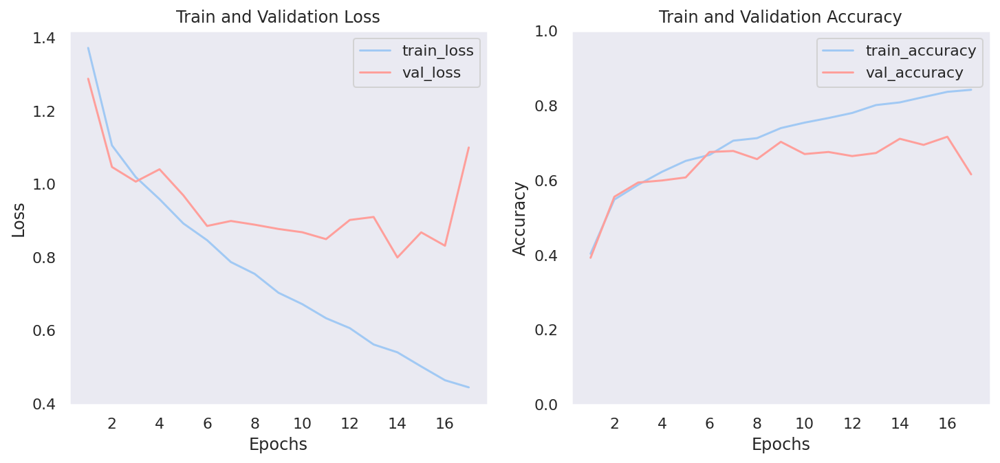

In [31]:
# 학습결과 시각화
import seaborn as sns
sns.set_theme(style='darkgrid', palette='pastel')

# history 1개 보여주는 그래프
def show_history(history):
    history_dict = history.history
    
    accuracy = history_dict['accuracy']
    val_accuracy = history_dict['val_accuracy']
    
    loss = history_dict['loss']
    val_loss = history_dict['val_loss']
    
    epochs = range(1, len(accuracy) + 1)
    
    fig = plt.figure(figsize=(12, 5))
    
    ax1 = fig.add_subplot(1, 2, 1)
    ax1.plot(epochs, loss, 'b-', label='train_loss')
    ax1.plot(epochs, val_loss, 'r-', label='val_loss')
    ax1.set_title('Train and Validation Loss')
    ax1.set_xlabel('Epochs')
    ax1.set_ylabel('Loss')
    ax1.grid()
    ax1.legend()
    
    ax2 = fig.add_subplot(1, 2, 2)
    ax2.plot(epochs, accuracy, 'b-', label='train_accuracy')
    ax2.plot(epochs, val_accuracy, 'r-', label='val_accuracy')

    ax2.set_ylim(0, 1)
    ax2.set_title('Train and Validation Accuracy')
    ax2.set_xlabel('Epochs')
    ax2.set_ylabel('Accuracy')
    ax2.grid()
    ax2.legend()
    
    plt.show()

show_history(history)

- 학습이 잘 되지 않았다 : 검증데이터의 손실값, 정확도의 선이 거의 일직선이다.
- base_model을 활용해봐야겠다.

## Memory management
- 다음 모델 사용을 위해 모델과 history를 먼저 저장해두고 사용한 메모리를 청소한다

In [32]:
# save model - basic cnn 
model.save('basic_cnn')

import os
import pickle

# Specify the directory path
directory_path = '/aiffel/workplace/EXPLORATION'

# Ensure the directory exists, create it if not
os.makedirs(directory_path, exist_ok=True)

# Full file path
file_path = os.path.join(directory_path, 'history_basic_cnn.pkl')

# save history - basic cnn
with open(file_path, 'wb') as file_pi:
    pickle.dump(history.history, file_pi)

INFO:tensorflow:Assets written to: basic_cnn/assets


INFO:tensorflow:Assets written to: basic_cnn/assets


In [33]:
# clear session
tf.keras.backend.clear_session()

# delete unesed variables
del model
del history

---
## Build model structure 2 - pre-trained ResNet50 V2
- *사실 [tensorflow tutorial](https://www.tensorflow.org/tutorials/images/transfer_learning#create_the_base_model_from_the_pre-trained_convnets)을 참고해서 [MobileNet V2](https://gaussian37.github.io/dl-concept-mobilenet_v2/) 모델을 사용해보려고 했는데 매우 많은 어려움이 있었다😭*
- Main quest 4에서 직접 구현해봤던 ResNet의 pre-trained 모델 [ResNet50 V2](https://www.tensorflow.org/api_docs/python/tf/keras/applications/resnet_v2/ResNet50V2?hl=en)을 사용해보려고한다.
- [ResNet 논문](https://arxiv.org/pdf/1512.03385.pdf)

**Pre-trained model**
- 데이터 양이 많지 않으니 미리 학습한 모델의 파라미터값을 사용해서 특성을 추출하고, 분류작업만 직접 학습하면서 진행한다

👉 tf.Keras Applications 에서 제공하는 ResNet50 V2 모델 사용 [link](https://www.tensorflow.org/api_docs/python/tf/keras/applications/resnet_v2/ResNet50V2?hl=en)
- ImageNet에 pretrained된 모델을 활용해서 학습

[참고]
- [keras doc](https://keras.io/api/applications/#usage-examples-for-image-classification-models)
- [blog](https://datacook.tistory.com/59)

---

**ResNet50 V2**
- The 50-layer ResNet uses a **bottleneck** design for the building block
    - **A bottleneck residual block uses 1×1 convolutions, known as a “bottleneck”, which reduces the number of parameters and matrix multiplications**
<img src = "./img/residual_connection.max-800x600.png" width = "40%" height = "40%">

**[구조]**
<img src = "./img/resnet.png" width = "60%" height = "60%">
- A 7×7 kernel convolution alongside 64 other kernels with a 2-sized stride.
- A max pooling layer with a 2-sized stride.
- 9 more layers—3×3,64 kernel convolution, another with 1×1,64 kernels, and a third with 1×1,256 kernels. These 3 layers are repeated 3 times. 
- 12 more layers with 1×1,128 kernels, 3×3,128 kernels, and 1×1,512 kernels, iterated 4 times.
- 18 more layers with 1×1,256 cores, and 2 cores 3×3,256 and 1×1,1024, iterated 6 times.
- 9 more layers with 1×1,512 cores, 3×3,512 cores, and 1×1,2048 cores iterated 3 times.<br>
    (up to this point the network has 50 layers)
- Average pooling, followed by a fully connected layer with 1000 nodes, using the softmax activation function.
[src](https://datagen.tech/guides/computer-vision/resnet-50/)

    👉 여기에서 `convolution layers`만 가져와서 사용한다

In [34]:
# Create the conv base from the pre-trained ResNet50 V2
IMG_SHAPE = tuple(IMG_SIZE) + (3,) # 이렇게도 차원을 추가할수 있다니?!
conv_base = tf.keras.applications.ResNet50V2(input_shape=IMG_SHAPE,
                                               include_top=False,  # for only feature extraction
                                               weights='imagenet')


In [35]:
# 학습때 사용했던 image_batch 사이즈 확인
image_batch.shape

TensorShape([32, 160, 160, 3])

In [36]:
# feature 추출 layer에 image_batch 넣어서 특징 추출
feature_batch = conv_base(image_batch)
print(feature_batch.shape)

(32, 5, 5, 2048)


- 굉장히 작은 이미지로 변환되었다.

## Feature extraction
- freeze the convolutional base and use as a feature extractor
- add classifier on top of it
- train top-level classifier

In [37]:
# freeze the convolutional base
conv_base.trainable=False

In [38]:
# model summary
conv_base.summary()

Model: "resnet50v2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 160, 160, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 166, 166, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 80, 80, 64)   9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
pool1_pad (ZeroPadding2D)       (None, 82, 82, 64)   0           conv1_conv[0][0]                 
_________________________________________________________________________________________

- 정말 엄청나게 깊은 구조다..! 
- 어떤 결과값이 나올지 궁금하다. (제발 학습이 되기를)

## Add a classification head

### Global Average Pooling
[Global average pooling](https://gaussian37.github.io/dl-concept-global_average_pooling/)
<img src = "./img/global_max_pooling.png" width=60% height=60%>
[picture link](https://peltarion.com/knowledge-center/documentation/modeling-view/build-an-ai-model/blocks/global-average-pooling-2d)
- 평균값을 활용해서 벡터의 차원을 줄이는 방법
    - Global Average Pooling을 거치게 되면 (Height, Width, Depth)의 shape를 가지는 3차원 이미지 shape은 (1,1,Depth)로 바뀜 => (Depth) 1차원 벡터와 동일 
- flatten layer 만드는 방법으로 사용가능

In [39]:
# GlobalAveragePooling
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 2048)


- [tutorial](https://www.tensorflow.org/tutorials/images/transfer_learning#add_a_classification_head)에서는 이진분류라 별도의 activation함수를 사용하지 않았지만 다중분류이기때문에 `softmax` activation function을 사용

In [40]:
# dense layer
dense_layer = Dense(2048, activation='relu')

In [41]:
# prediction layer
prediction_layer = Dense(5, activation='softmax') # classify 5 classes

prediction_batch = prediction_layer(feature_batch_average)

print(prediction_batch.shape)

(32, 5)


### Combine layers to build a model
- Sequential API 사용

In [42]:
# ResNet50 V2
def build_model():
    model = Sequential([
        conv_base,
        global_average_layer,
        dense_layer,
        prediction_layer
    ])
    
    return model

## Compile model 2
- learning rate 는 0.01로 설정
- optimizer는 Adam을 사용

In [43]:
# gpu로 모델 빌드, 컴파일
with tf.device('/GPU:0'):
    model = build_model()
    
    base_learning_rate = 0.001
    
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate),
        loss=tf.keras.losses.sparse_categorical_crossentropy,
        metrics=['accuracy'])
    
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50v2 (Functional)      (None, 5, 5, 2048)        23564800  
_________________________________________________________________
global_average_pooling2d (Gl (None, 2048)              0         
_________________________________________________________________
dense (Dense)                (None, 2048)              4196352   
_________________________________________________________________
dense_1 (Dense)              (None, 5)                 10245     
Total params: 27,771,397
Trainable params: 4,206,597
Non-trainable params: 23,564,800
_________________________________________________________________


>ValueError: Dimensions must be equal, but are 512 and 2048 for '{{node dense/MatMul}} = MatMul[T=DT_FLOAT, transpose_a=false, transpose_b=false](Placeholder, dense/MatMul/ReadVariableOp)' with input shapes: [?,512], [2048,5].

- dense layer의 node 개수를 512로 지정해서 위와 같은 에러가 발생했다.. 한참을 헤맸지만 해결!
- resnet 모델의 깊이가 너무 깊어서 global average pooling을 했는데도 피처맵 사이즈가 2048개가 나와서 학습해야할 파라미터 수가 꽤 많다..!

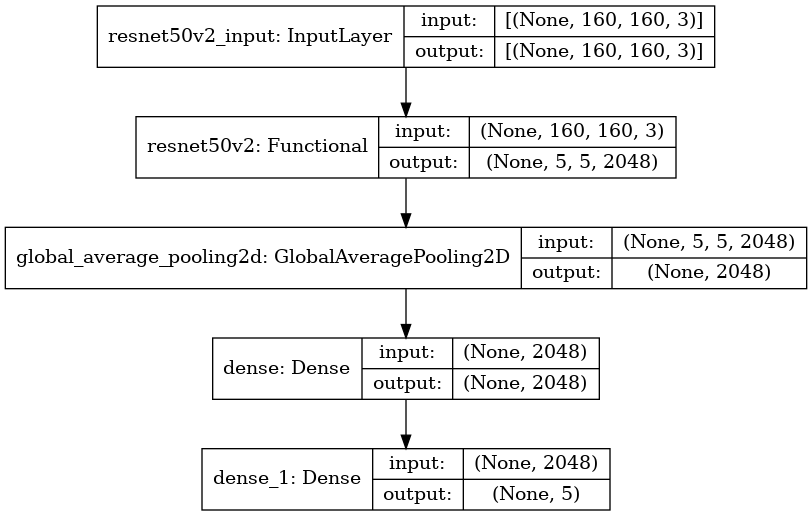

In [44]:
tf.keras.utils.plot_model(model, show_shapes=True)

## Train the model

In [45]:
# model training
# EPOCHS = 20

# checkpoint
check_point_cb = ModelCheckpoint('resnet50_v2.keras')

with tf.device('/GPU:0'):
    history = model.fit(train_batches,
                        epochs=EPOCHS,
                        validation_data=validation_batches,
                       callbacks=[check_point_cb, early_stopping_cb])

Epoch 1/20
92/92 [==============================] - 12s 80ms/step - loss: 0.8084 - accuracy: 0.7830 - val_loss: 0.3966 - val_accuracy: 0.8474
Epoch 2/20
92/92 [==============================] - 7s 58ms/step - loss: 0.2561 - accuracy: 0.9022 - val_loss: 0.4691 - val_accuracy: 0.8420
Epoch 3/20
92/92 [==============================] - 6s 58ms/step - loss: 0.1433 - accuracy: 0.9513 - val_loss: 0.4533 - val_accuracy: 0.8638
Epoch 4/20
92/92 [==============================] - 6s 57ms/step - loss: 0.1012 - accuracy: 0.9601 - val_loss: 0.5209 - val_accuracy: 0.8556


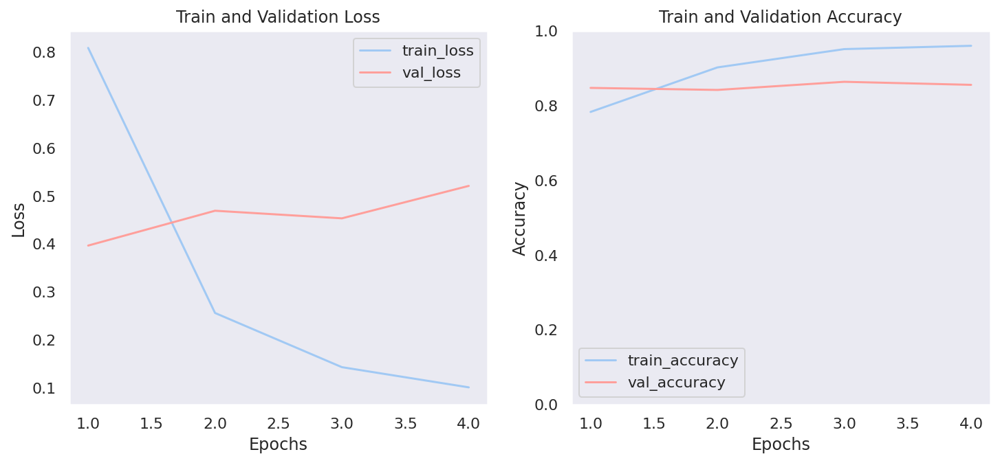

In [46]:
# 결과 시각화
show_history(history)

- 성능이 매우 좋아졌다!
- 반면 validation loss는 매우 높다
- validation loss값이 떨어지던 중이었을까...?
- 모델 평가후에 learning rate를 조정해서 다시 모델 훈련을 시도해본다

## Evaluate model

In [47]:
#test sample 에측 결과 확인 - 0~1 사이의 확률값 출력
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

array([[9.99999881e-01, 3.65714925e-08, 8.24369835e-08, 3.31616263e-08,
        1.15658221e-08],
       [5.66989707e-04, 7.03956038e-02, 8.88446689e-01, 2.39643711e-03,
        3.81943472e-02],
       [9.98028457e-01, 1.21336861e-03, 3.08207964e-05, 5.84361900e-04,
        1.42881094e-04],
       [8.55983436e-01, 3.00967571e-04, 2.46692318e-02, 1.17693454e-01,
        1.35292171e-03],
       [5.50881540e-03, 2.46779956e-02, 9.55436826e-01, 4.05807421e-03,
        1.03183631e-02],
       [9.87702668e-01, 6.50099106e-03, 1.02431956e-03, 4.23175050e-03,
        5.40327048e-04],
       [1.68262143e-02, 4.33971966e-03, 9.36174750e-01, 2.97931824e-02,
        1.28661068e-02],
       [7.48863101e-01, 8.38785246e-02, 2.41827150e-03, 1.28204122e-01,
        3.66359428e-02],
       [1.00000000e+00, 2.30508377e-08, 2.41136805e-10, 2.58938138e-09,
        3.74670339e-09],
       [9.03762598e-03, 1.11419533e-03, 5.11120185e-02, 9.34355259e-01,
        4.38080123e-03],
       [4.98759582e-05, 5.9235

In [48]:
# 추론한 값을 실제 추론한 라벨로 변환
import numpy as np

predictions = np.argmax(predictions, axis=1)
predictions

array([0, 2, 0, 0, 2, 0, 2, 0, 0, 3, 4, 3, 0, 0, 0, 2, 0, 2, 3, 2, 0, 4,
       2, 1, 0, 1, 2, 3, 2, 2, 4, 3])

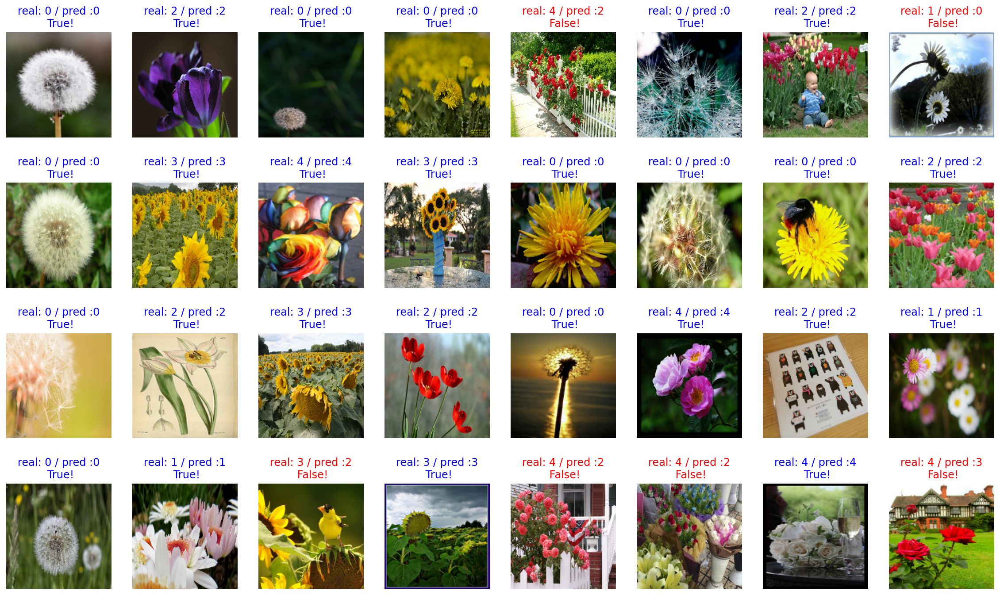

In [49]:
# 배치별 이미지 시각화
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [50]:
# 정확도 출력
count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100)

81.25


- 오 81.25%의 정확도를 가진다!
- 앞서 확인했던 이상한 데이터들을 확인해본다

## Check data outliers

라벨: tf.Tensor(4, shape=(), dtype=int64), 예측결과: 2


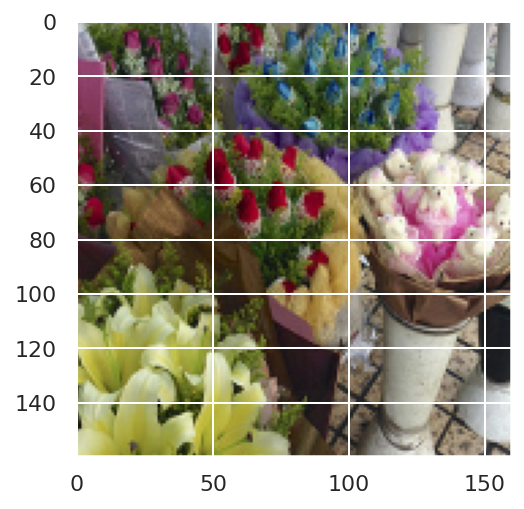

라벨: tf.Tensor(4, shape=(), dtype=int64), 예측결과: 2


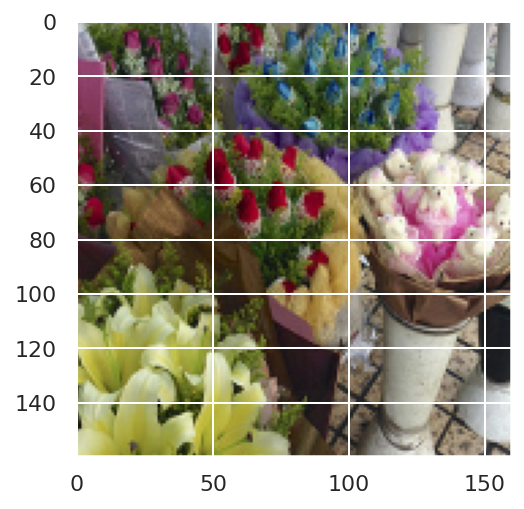

라벨: tf.Tensor(4, shape=(), dtype=int64), 예측결과: 2


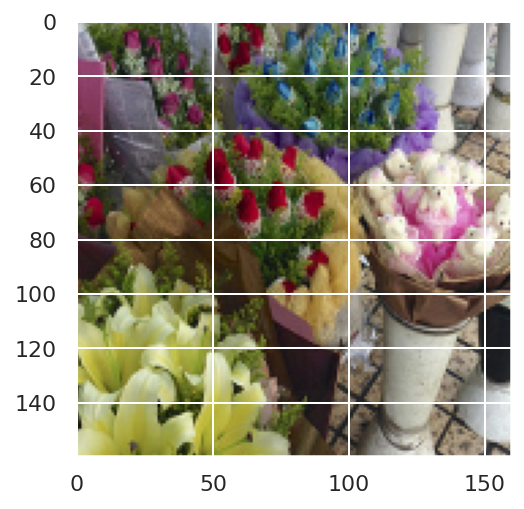

라벨: tf.Tensor(4, shape=(), dtype=int64), 예측결과: 2


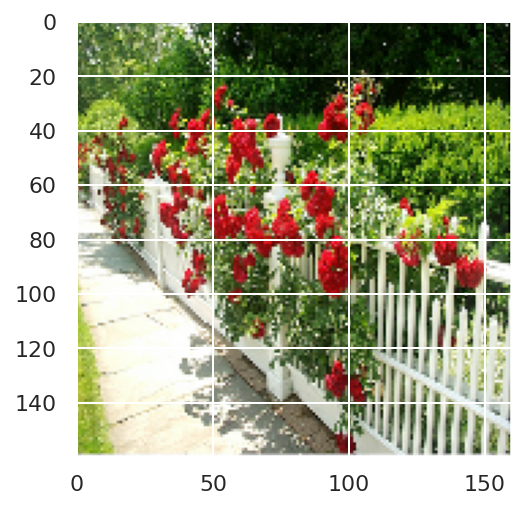

라벨: tf.Tensor(1, shape=(), dtype=int64), 예측결과: 0


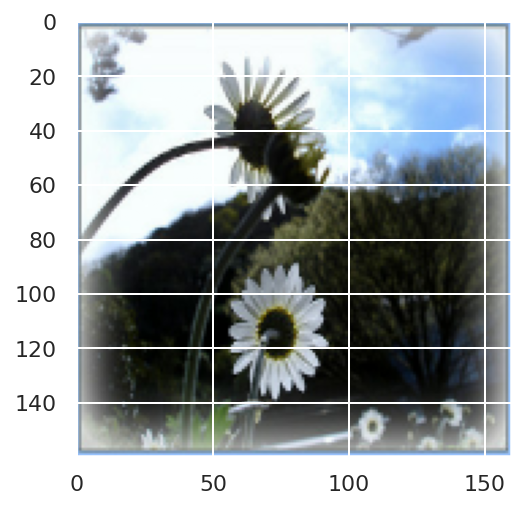

In [53]:
# 정답과 다른 예측을 하는 경우 확인
import random 
wrong_predict_list=[]
for i, _ in enumerate(predictions):
    # i번째 test_labels과 y_test이 다른 경우만 모아 봅시다. 
    if predictions[i] != labels[i]:
        wrong_predict_list.append(i)


# wrong_predict_list 에서 랜덤하게 5개 추출
samples = random.choices(population=wrong_predict_list, k=5)

for n in samples:
    print("라벨: " + str(labels[n]) + ", 예측결과: " + str(predictions[n]))
    img = (images[n] + 1) / 2
    plt.imshow(img, cmap=plt.cm.binary)
    plt.show()

- 이 과정을 하는게 큰 의미가 없었다. 배치 이미지 중에 한개만 가져와서 테스트 했던거라 랜덤으로 잘못 분류한 5개의 이미지를 뽑으려고 했지만 배치별 이미지 시각화에 나온 이미지 6개가 중복해서 출력되었다.
- 이전에 사용했던 코드를 이번 노트북에 맞춰서 변환하는 연습을 했다는 것에 의의를 두어야겠다.

In [54]:
# save model - basic cnn 
model.save('resnet50_v2')

# Full file path
file_path = os.path.join(directory_path, 'history_resnet50_v2.pkl')

# save history - resnet50 v2 ver.1
with open(file_path, 'wb') as file_pi:
    pickle.dump(history.history, file_pi)

INFO:tensorflow:Assets written to: resnet50_v2/assets


INFO:tensorflow:Assets written to: resnet50_v2/assets


In [55]:
# clear session
tf.keras.backend.clear_session()

# delete unesed variables
del model
del history

## Build model structure 3 - pre-trained MobileNet V2
- 어제 시도하다가 실패했던 MobileNet V2으로 훈련을 시도해본다

- [tensorflow tutorial](https://www.tensorflow.org/tutorials/images/transfer_learning#create_the_base_model_from_the_pre-trained_convnets)
- [MobileNet v2 설명](https://gaussian37.github.io/dl-concept-mobilenet_v2/)

**[MobileNet V2]**
> This is pre-trained on the ImageNet dataset, a large dataset consisting of 1.4M images and 1000 classes [출처 : tensorflow.doc](https://www.tensorflow.org/tutorials/images/transfer_learning#create_the_base_model_from_the_pre-trained_convnets)

<img src='./img/MobileNetV2.png'>

- 2가지 종류 블록
    - 1. residual block : stride 1
    - 2. downsizing block : stride 2
- 각 블록은 3개의 layer를 가짐



In [56]:
IMG_SHAPE

(160, 160, 3)

In [57]:
# Create the base model from the pre-trained model MobileNet V2
conv_base = tf.keras.applications.MobileNetV2(input_shape=IMG_SHAPE,
                                               include_top=False,  # for only feature extraction
                                               weights='imagenet')

In [58]:
# 학습때 사용했던 image_batch 사이즈 확인
image_batch.shape

TensorShape([32, 160, 160, 3])

- 이번엔 augmentation layer를 사용할거라 image batch를 다시 생성한다!

In [59]:
train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)

In [60]:
# train batch 중 하나 확인
for image_batch, label_batch in train_batches.take(1):
    break

image_batch.shape, label_batch.shape

(TensorShape([32, 160, 160, 3]), TensorShape([32]))

In [61]:
# feature 추출 layer에 image_batch 넣어서 특징 추출
feature_batch = conv_base(image_batch)
print(feature_batch.shape)

(32, 5, 5, 1280)


- MobileNet V2는 1280의 피처맵이 나온다

In [62]:
# freeze the convolutional base
conv_base.trainable=False

In [63]:
# model summary
conv_base.summary()

Model: "mobilenetv2_1.00_160"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 160, 160, 3) 0                                            
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, 80, 80, 32)   864         input_1[0][0]                    
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, 80, 80, 32)   128         Conv1[0][0]                      
__________________________________________________________________________________________________
Conv1_relu (ReLU)               (None, 80, 80, 32)   0           bn_Conv1[0][0]                   
_______________________________________________________________________________

In [64]:
# GlobalAveragePooling
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 1280)


- [tutorial](https://www.tensorflow.org/tutorials/images/transfer_learning#add_a_classification_head)에서는 이진분류라 별도의 activation함수를 사용하지 않았지만 다중분류이기때문에 `softmax` activation function을 사용

In [65]:
prediction_layer = Dense(5, activation='softmax') # classify 5 classes
prediction_batch = prediction_layer(feature_batch_average)
print(prediction_batch.shape)

(32, 5)


- data augmentation을 model.fit에서 사용해보는걸 다시 도전!

In [66]:
# augment layer
data_augmentation = Sequential([
  tf.keras.layers.RandomFlip('horizontal'),
  tf.keras.layers.RandomRotation(0.2),
])

In [67]:
def build_model():
    model = Sequential([
        tf.keras.Input(shape=(IMG_SIZE[0], IMG_SIZE[1], 3)),
        data_augmentation,
        conv_base,
        global_average_layer,
        tf.keras.layers.Dropout(0.2),  # tutorial대로 dropout 추가
        prediction_layer
    ])
    
    return model

## Compile model 3

In [68]:
# gpu로 모델 빌드, 컴파일
with tf.device('/GPU:0'):
    model = build_model()
    
    base_learning_rate = 0.0001 # tutorial 참고
    
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate),
        loss=tf.keras.losses.sparse_categorical_crossentropy,
        metrics=['accuracy'])
    
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential (Sequential)      (None, 160, 160, 3)       0         
_________________________________________________________________
mobilenetv2_1.00_160 (Functi (None, 5, 5, 1280)        2257984   
_________________________________________________________________
global_average_pooling2d (Gl (None, 1280)              0         
_________________________________________________________________
dropout (Dropout)            (None, 1280)              0         
_________________________________________________________________
dense (Dense)                (None, 5)                 6405      
Total params: 2,264,389
Trainable params: 6,405
Non-trainable params: 2,257,984
_________________________________________________________________


In [69]:
# check trainable parameters
len(model.trainable_variables)

2

- weights, biases 두 종류 variable 학습

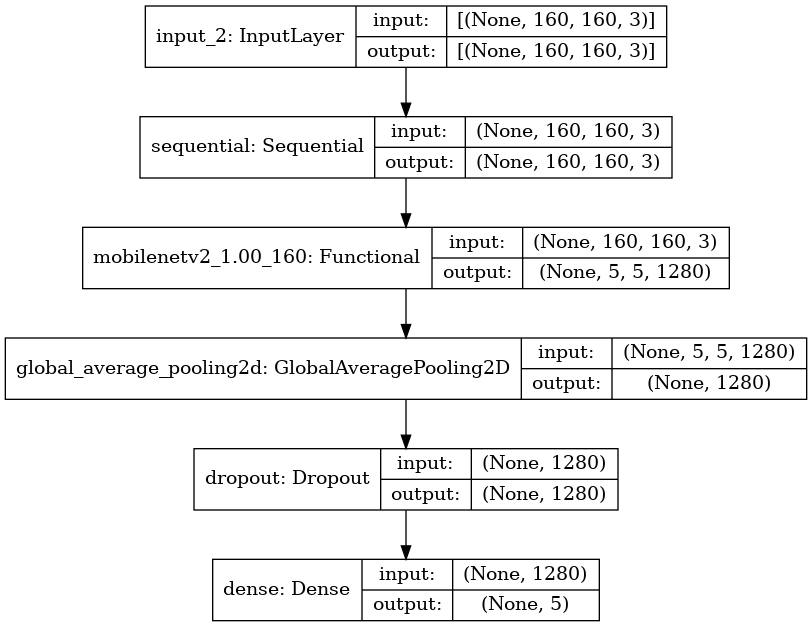

In [70]:
tf.keras.utils.plot_model(model, show_shapes=True)

## Train the model

In [71]:
# model training
# EPOCHS = 20

# checkpoint
check_point_cb = ModelCheckpoint('mobilenet_v2.keras')

with tf.device('/GPU:0'):
    history = model.fit(train_batches,
                        epochs=EPOCHS,
                        validation_data=validation_batches,
                       callbacks=[check_point_cb, early_stopping_cb])

Epoch 1/20
92/92 [==============================] - 9s 57ms/step - loss: 1.6929 - accuracy: 0.3215 - val_loss: 1.3429 - val_accuracy: 0.4387
Epoch 2/20
92/92 [==============================] - 5s 45ms/step - loss: 1.2289 - accuracy: 0.5177 - val_loss: 1.0362 - val_accuracy: 0.6104
Epoch 3/20
92/92 [==============================] - 5s 43ms/step - loss: 0.9910 - accuracy: 0.6274 - val_loss: 0.8645 - val_accuracy: 0.6785
Epoch 4/20
92/92 [==============================] - 5s 44ms/step - loss: 0.8313 - accuracy: 0.6962 - val_loss: 0.7540 - val_accuracy: 0.7439
Epoch 5/20
92/92 [==============================] - 5s 43ms/step - loss: 0.7479 - accuracy: 0.7381 - val_loss: 0.6774 - val_accuracy: 0.7657
Epoch 6/20
92/92 [==============================] - 5s 44ms/step - loss: 0.6695 - accuracy: 0.7674 - val_loss: 0.6181 - val_accuracy: 0.7847
Epoch 7/20
92/92 [==============================] - 5s 43ms/step - loss: 0.6051 - accuracy: 0.7861 - val_loss: 0.5772 - val_accuracy: 0.8038
Epoch 8/20
92

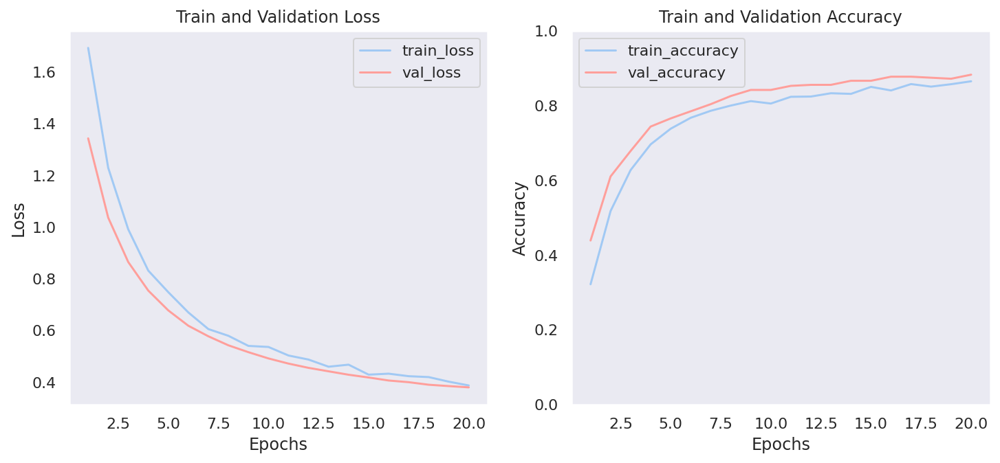

In [72]:
show_history(history)

- 오 이 모델은 validation 손실값이 점점 낮아지는 추세를 보인다.
    - epoch를 더 많이 했다면 더 좋은 성능을 보였을지 뭔가 아쉽다. 
- resnet 모델과 history를 비교해본다

In [73]:
# history 2개 비교 함수
def compare_history(history, history2):
    history_dict = history # assuming history is loaded
    history2_dict = history2.history

    loss = history_dict['loss']
    val_loss = history_dict['val_loss']
    second_loss = history2_dict['loss']
    second_val_loss = history2_dict['val_loss']
    
    accuracy = history_dict['accuracy']
    val_accuracy = history_dict['val_accuracy']
    second_accuracy = history2_dict['accuracy']
    second_val_accuracy = history2_dict['val_accuracy']

    epochs = range(len(accuracy))
    
    fig = plt.figure(figsize=(12, 5))

    ax1 = fig.add_subplot(1, 2, 1)
    ax1.plot(epochs, second_loss[:len(epochs)], 'b-', label='model2 train_loss')
    ax1.plot(epochs, second_val_loss[:len(epochs)], 'r-', label='model2 val_loss')
    ax1.plot(epochs, loss[:len(epochs)], 'b--', label='model1 train_loss')
    ax1.plot(epochs, val_loss[:len(epochs)], 'r--', label='model1 val_loss')

    ax1.set_ylim(min(min(loss), min(second_loss)), max(max(loss), max(second_loss)))
    ax1.set_title('Train and Validation Loss')
    ax1.set_xlabel('Epochs')
    ax1.set_ylabel('Loss')
    ax1.grid()
    ax1.legend()

    ax2 = fig.add_subplot(1, 2, 2)
    ax2.plot(epochs, second_accuracy[:len(epochs)], 'b-', label='model2 train_accuracy')
    ax2.plot(epochs, second_val_accuracy[:len(epochs)], 'r-', label='model2 val_accuracy')
    ax2.plot(epochs, accuracy[:len(epochs)], 'b--', label='model1 train_accuracy')
    ax2.plot(epochs, val_accuracy[:len(epochs)], 'r--', label='model1 val_accuracy')

    # Set y-axis limits for accuracy plots
    ax2.set_ylim(0, 1)
    
    ax2.set_title('Train and Validation Accuracy')
    ax2.set_xlabel('Epochs')
    ax2.set_ylabel('Accuracy')
    ax2.grid()
    ax2.legend()

    plt.show()

In [74]:
# load the vgg16 history back
with open(file_path, 'rb') as file:
    resnet50_history = pickle.load(file)

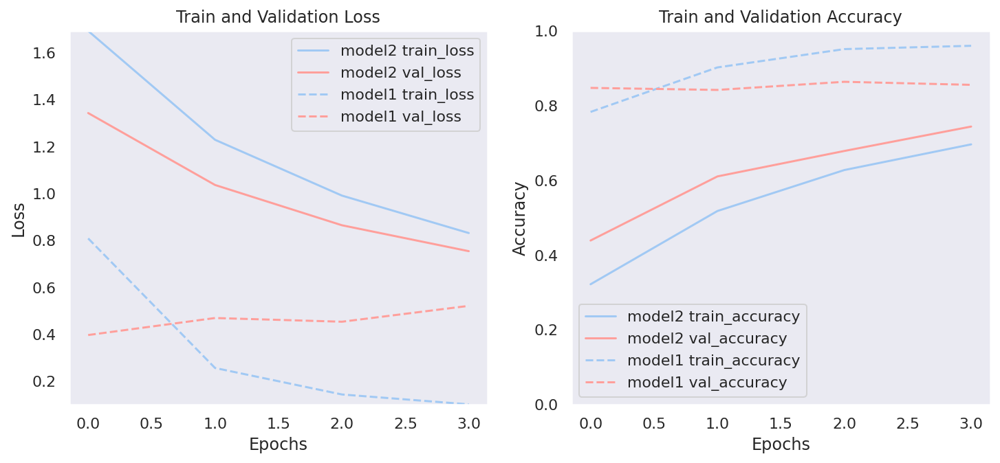

In [75]:
compare_history(resnet50_history, history)

- 그래프로 비교해보니 resnet50 model의 성능이 훨씬 좋다. resnet50을 불러와서 최종 모델 평가를 진행해본다

In [78]:
# load model
resnet50_model = tf.keras.models.load_model('resnet50_v2')
resnet50_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50v2 (Functional)      (None, 5, 5, 2048)        23564800  
_________________________________________________________________
global_average_pooling2d (Gl (None, 2048)              0         
_________________________________________________________________
dense (Dense)                (None, 2048)              4196352   
_________________________________________________________________
dense_1 (Dense)              (None, 5)                 10245     
Total params: 27,771,397
Trainable params: 4,206,597
Non-trainable params: 23,564,800
_________________________________________________________________


In [79]:
# evaluate resnet50 model
evaluation_results = model.evaluate(test_batches)
print("Loss:", evaluation_results[0])
print("Metrics:", evaluation_results[1:])

12/12 [==============================] - 1s 38ms/step - loss: 0.3515 - accuracy: 0.8828
Loss: 0.35149085521698
Metrics: [0.8828337788581848]


## Predict
- 내가 가진 사진으로 예측을 시도해본다!

In [84]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array
# predict function
def show_and_predict_image(dirpath, filename, img_size=160):
    filepath = os.path.join(dirpath, filename)
    image = load_img(filepath, target_size=(img_size, img_size))
    plt.imshow(image)
    plt.axis('off')
    image = img_to_array(image).reshape(1, img_size, img_size, 3)
    prediction = model.predict(image)
    
    predicted_class_index = np.argmax(prediction)
    class_labels = ['Dandelion', 'Daisy', 'Tulips', 'Sunflowers', 'Roses']
    
    highest_class_label = class_labels[predicted_class_index]
#     highest_percentage = round(prediction[predicted_class_index] * 100)

#     print(f"This image seems {highest_percentage}% {highest_class_label}.")
    print(f"This image seems {highest_class_label}.")

This image seems Tulips.


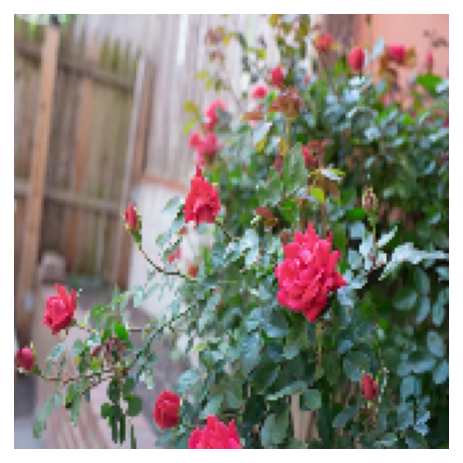

In [85]:
filename = 'roses.jpg'

IMG_SIZE = 160
img_dir_path = os.getenv("HOME") + "/aiffel/workplace/EXPLORATION"

show_and_predict_image(img_dir_path, filename)

- 정답이 아니다😆

---

# Summary
- 정말 많은 시도를 했다.
- 어제보다 더 알게 된 느낌이다.
- 

# 회고

**[KEEP]**
- 배치이미지와 여러 모델을 불러와서 훈련하는 전체 플로우를 어느정도 익힌것같다

**[PROBLEM]**
- data augmentation 기법을 적용하는게 너무 어렵다. 어떤 방식으로 이 기법이 적용되는건지, 실제로 데이터가 늘어나는지 확인해보려고했지만 확인이 잘 안되고, 라이브러리를 활용해서 적용하면 결과를 어떻게 확인해야하는지, 잘 되고 있는건지, 모델훈련에 사용된게 맞는지 등 전반에 대한 이해가 잘 안되고 있다.
- tf.data 에 대한 이해도 여전히 부족하고, Tensor는 map함수 인자로 넣지 못한다고 에러가 나기도 하고, 기타 데이터 형식 관련해서도 에러가 계속 났다. 데이터를 어떻게 다뤄야하는지 분명하게 이해를 하고 넘어가야 다른 모델을 활용해볼수 있을것 같다.

**[TRY]**
- 마지막 predict 함수 구현을 다시 시도해본다.
- data augmentation 관련 공부를 하고 다시 시도해본다.
- tf.data에 대한 공식문서를 천천히 읽어보고, 관련 정리된 블로그도 찾아서 정리해보자.